paper: https://link.springer.com/article/10.1007/s11111-024-00452-9#Sec10

Prophet: https://facebook.github.io/prophet/docs/quick_start.html#python-api  
github: https://github.com/facebook/prophet  

In [2]:
import os
import gc
import numpy as np
import pandas as pd
from tqdm import tqdm
from pathlib import Path

# Geospatial
import geopandas as gpd
import dask_geopandas as dgpd
import rasterio
from rasterstats import zonal_stats
from osgeo import gdal, osr

# Statistics & Bayesian modeling
import pymc as pm
import arviz as az

# Visualisation
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Base directories
BASE_DIR = Path("/Users/wenlanzhang/PycharmProjects/Mapineq/src/")
DATA_DIR = Path("/Users/wenlanzhang/Downloads/PhD_UCL/Data/Oxford")

| Feature                            | **Prophet**                                    | **STL**                             |
| ---------------------------------- | ---------------------------------------------- | ----------------------------------- |
| **Purpose**                        | Forecasting + decomposition                    | Decomposition only (no forecasting) |
| **Components**                     | Trend + Seasonality + Holidays                 | Trend + Seasonality + Residuals     |
| **Handles missing data?**          | Yes                                            | No (must handle manually)           |
| **Handles irregular time series?** | Yes                                            | No (requires evenly spaced data)    |
| **Forecasting**                    | Yes (core feature)                             | ❌ No forecasting                    |
| **Custom seasonality/holidays**    | Yes (add holidays, custom cycles)              | No                                  |
| **Trend modeling**                 | Piecewise linear or logistic with changepoints | LOESS smoothing (local regression)  |
| **Built-in in Python via**         | `prophet` package                              | `statsmodels.tsa.seasonal.STL`      |


In [2]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

## Example 

In [3]:
# Python
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_peyton_manning.csv')
df.head()
# 2905 rows

,ds,y
0,2007-12-10,9.590761
1,2007-12-11,8.519590
2,2007-12-12,8.183677
3,2007-12-13,8.072467
4,2007-12-14,7.893572


In [4]:
m = Prophet()
m.fit(df)

20:52:37 - cmdstanpy - INFO - Chain [1] start processing
20:52:37 - cmdstanpy - INFO - Chain [1] done processing


In [5]:
future = m.make_future_dataframe(periods=365)
future.tail()
# 3270 row

,ds
3265,2017-01-15
3266,2017-01-16
3267,2017-01-17
3268,2017-01-18
3269,2017-01-19


In [6]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3265,2017-01-15,8.204239,7.492066,8.977694
3266,2017-01-16,8.529231,7.808252,9.288746
3267,2017-01-17,8.316611,7.561663,9.019852
3268,2017-01-18,8.149244,7.424333,8.886321
3269,2017-01-19,8.161142,7.473334,8.939588


/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


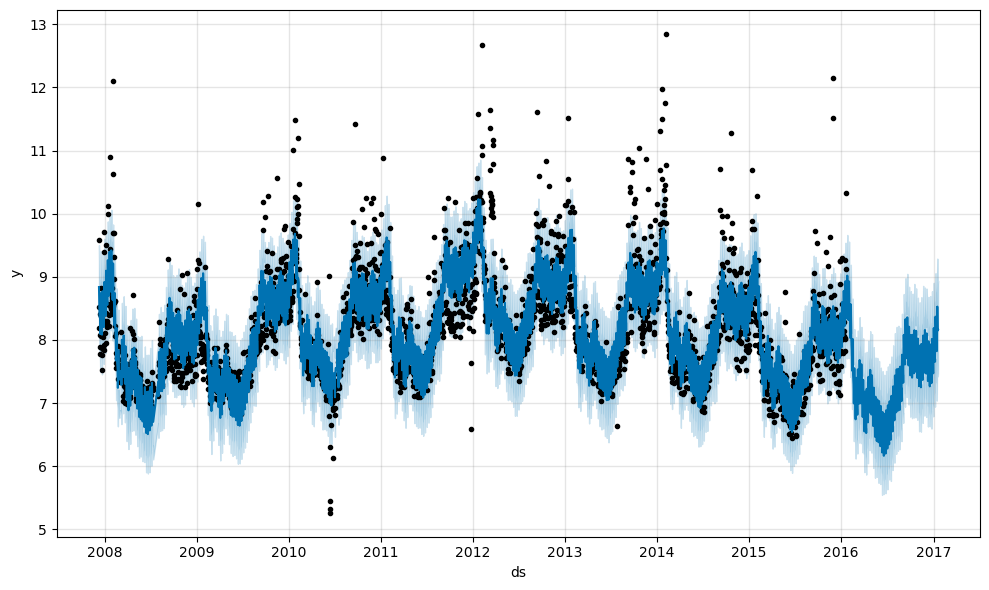

In [7]:
fig1 = m.plot(forecast)

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:351: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:354: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects in

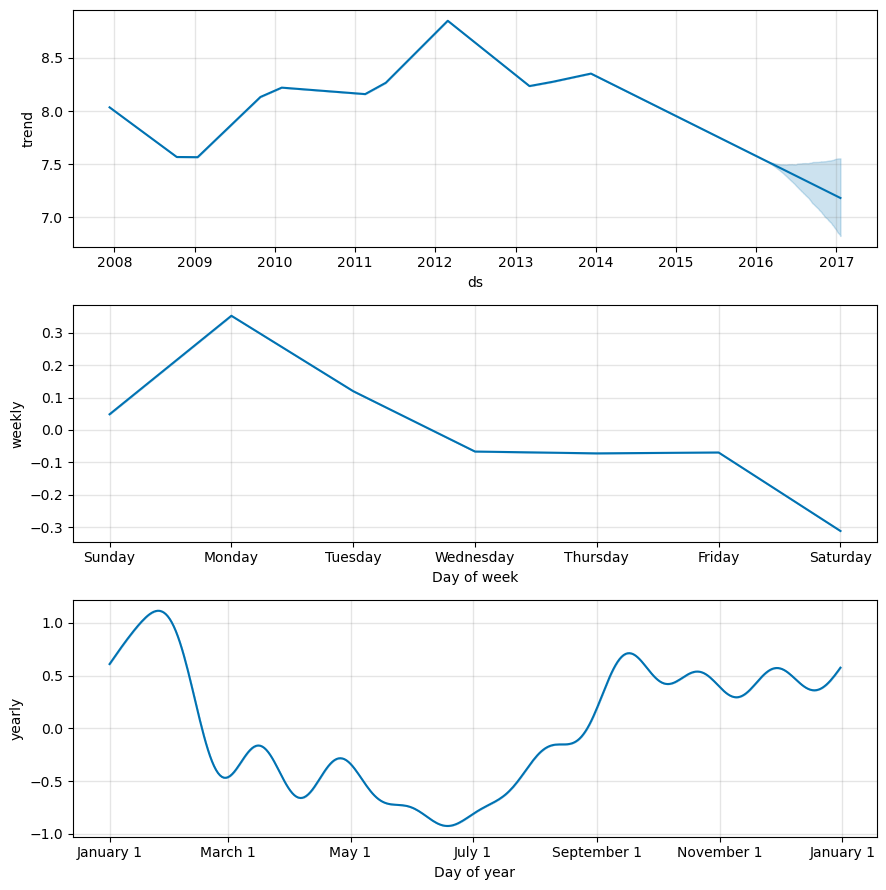

In [8]:
fig2 = m.plot_components(forecast)

In [9]:
plot_plotly(m, forecast)

In [10]:
plot_components_plotly(m, forecast)

# Actual 

In [11]:
df = pd.read_csv(DATA_DIR/f"Migration/international_migration_flow.csv") 
df['year'] = pd.to_datetime(df['migration_month']).dt.year
df['month'] = pd.to_datetime(df['migration_month']).dt.month
df["migration_month"] = pd.to_datetime(df["migration_month"])

# Define the mapping of old codes to new codes
country_code_mapping = {
    'GR': 'EL',  # Greece (GR → EL)
    'GB': 'UK'   # United Kingdom (GB → UK)
}

# Apply the replacement to both columns
df['country_from'] = df['country_from'].replace(country_code_mapping)
df['country_to'] = df['country_to'].replace(country_code_mapping)

df
# len(df['country_from'].unique())

,country_from,country_to,migration_month,num_migrants,year,month
0,AD,AE,2019-01-01,12,2019,1
1,AD,AE,2019-02-01,2,2019,2
2,AD,AE,2019-03-01,1,2019,3
3,AD,AE,2019-04-01,7,2019,4
4,AD,AE,2019-05-01,0,2019,5
...,...,...,...,...,...,...
1563149,ZW,ZM,2022-08-01,138,2022,8
1563150,ZW,ZM,2022-09-01,162,2022,9
1563151,ZW,ZM,2022-10-01,149,2022,10
1563152,ZW,ZM,2022-11-01,104,2022,11


## VE-CO

In [35]:
df_ve_co = df[(df['country_from'] == 'VE') & (df['num_migrants'] != 0) & (df['country_to'] == 'CO')]
df_co_ve = df[(df['country_from'] == 'CO') & (df['num_migrants'] != 0) & (df['country_to'] == 'VE')]
df_ve_co

,country_from,country_to,migration_month,num_migrants,year,month
1487122,VE,CO,2019-01-01,71081,2019,1
1487123,VE,CO,2019-02-01,78988,2019,2
1487124,VE,CO,2019-03-01,77678,2019,3
1487125,VE,CO,2019-04-01,83418,2019,4
1487126,VE,CO,2019-05-01,78685,2019,5
1487127,VE,CO,2019-06-01,72160,2019,6
1487128,VE,CO,2019-07-01,80113,2019,7
1487129,VE,CO,2019-08-01,81646,2019,8
1487130,VE,CO,2019-09-01,67059,2019,9
1487131,VE,CO,2019-10-01,65113,2019,10


20:59:34 - cmdstanpy - INFO - Chain [1] start processing
20:59:34 - cmdstanpy - INFO - Chain [1] done processing
/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime

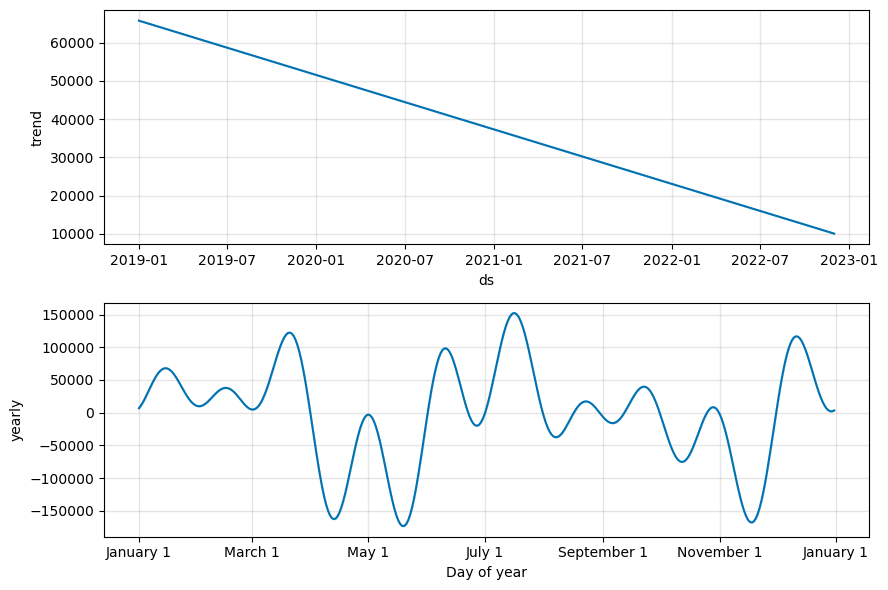

In [36]:
df_prophet = df_ve_co.copy().rename(columns={
    'migration_month': 'ds',
    'num_migrants': 'y'
})

# Step 2: Convert date to datetime
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Step 3: Initialize Prophet
model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False
)

# Step 4: Fit the model to your data
model.fit(df_prophet)

# Step 5: Use the same data as the "future" frame (no need to extend it)
forecast = model.predict(df_prophet)

# Step 6: Plot the components (trend and seasonality)
model.plot_components(forecast)
plt.show()

20:59:39 - cmdstanpy - INFO - Chain [1] start processing
20:59:40 - cmdstanpy - INFO - Chain [1] done processing
/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



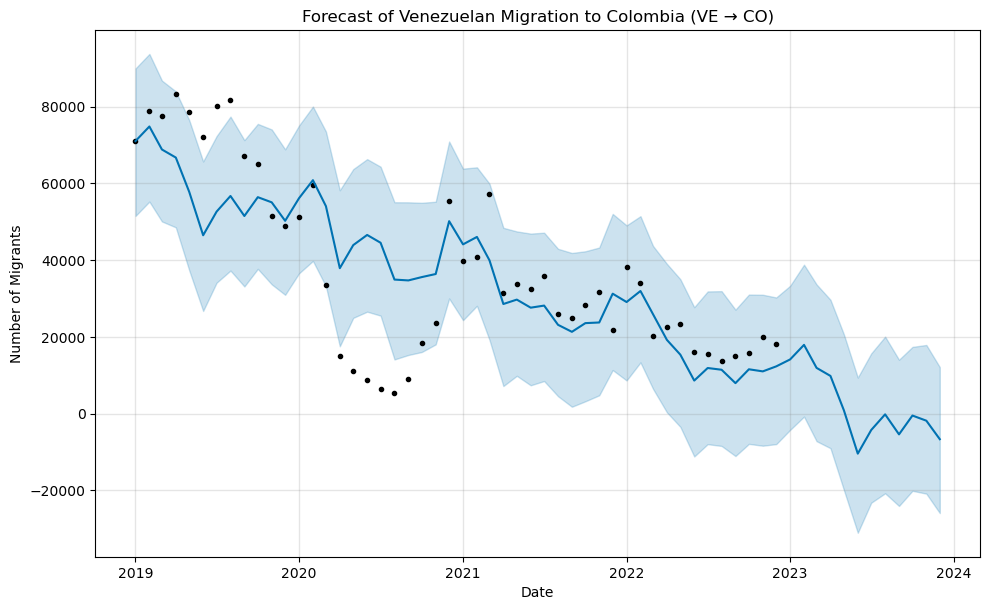

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



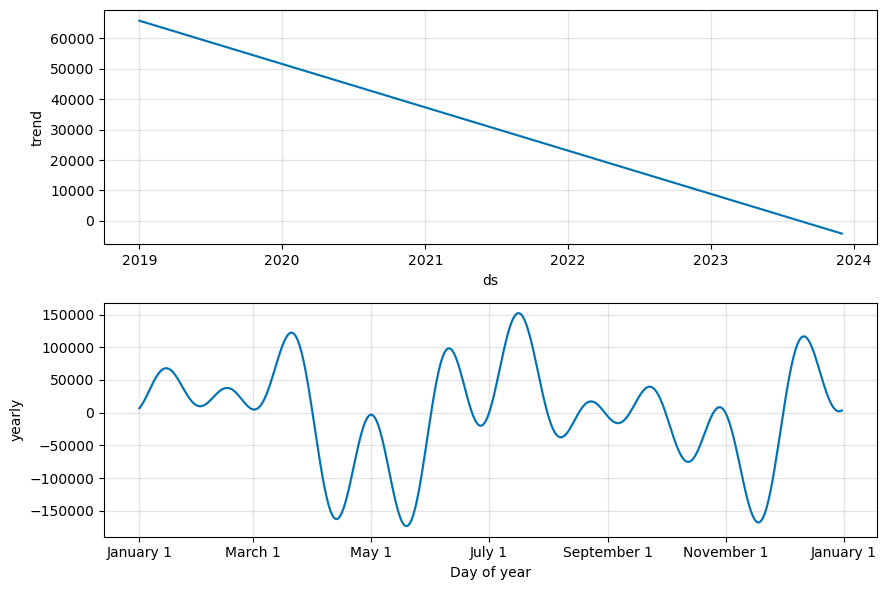

,ds,yhat,yhat_lower,yhat_upper
48,2023-01-01,14101.829428,-4261.067644,33293.558080
49,2023-02-01,17894.362652,-802.440507,38796.482805
50,2023-03-01,11899.667772,-7206.559187,33651.660841
51,2023-04-01,9800.897901,-9039.742512,29654.789123
52,2023-05-01,830.538310,-19940.389954,20623.657345
53,2023-06-01,-10457.626286,-31086.290436,9373.961616
54,2023-07-01,-4293.496436,-23246.080384,15673.677833
55,2023-08-01,-214.348641,-20795.739205,20039.243414
56,2023-09-01,-5434.859805,-24095.259207,14019.492104
57,2023-10-01,-526.004724,-20142.314253,17368.974738


In [37]:
# Step 1. Prepare the data
df_prophet = df_ve_co.copy().rename(columns={
    'migration_month': 'ds',
    'num_migrants': 'y'
})

df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Step 2. Initialize Prophet model
model = Prophet(
    yearly_seasonality=True,   # Important for migration patterns
    weekly_seasonality=False,
    daily_seasonality=False
)

# Step 3. Fit the model
model.fit(df_prophet)

# Step 4. Create a future dataframe for forecasting
# Determine how many months to predict
last_date = df_prophet['ds'].max()
future = model.make_future_dataframe(periods=12, freq='MS')  # Predict 12 months after last_date

# Step 5. Generate the forecast
forecast = model.predict(future)

# Step 6. Filter only the 2023 predictions
forecast_2023 = forecast[(forecast['ds'] >= '2023-01-01') & (forecast['ds'] <= '2023-12-31')]

# Step 7. Plot the forecast
fig1 = model.plot(forecast)
plt.title("Forecast of Venezuelan Migration to Colombia (VE → CO)")
plt.xlabel("Date")
plt.ylabel("Number of Migrants")
plt.show()

# Step 8. Plot trend & seasonality components
fig2 = model.plot_components(forecast)
plt.show()

# Step 9. Display predicted 2023 migration numbers
forecast_2023[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]


## VE-CL

In [24]:
df_ve_cl = df[(df['country_from'] == 'VE') & (df['num_migrants'] != 0) & (df['country_to'] == 'CL') & (df['year'] < 2021)]
df_ve_cl

,country_from,country_to,migration_month,num_migrants,year,month
1487026,VE,CL,2019-01-01,13914,2019,1
1487027,VE,CL,2019-02-01,15667,2019,2
1487028,VE,CL,2019-03-01,17882,2019,3
1487029,VE,CL,2019-04-01,19370,2019,4
1487030,VE,CL,2019-05-01,19505,2019,5
1487031,VE,CL,2019-06-01,15387,2019,6
1487032,VE,CL,2019-07-01,6586,2019,7
1487033,VE,CL,2019-08-01,5451,2019,8
1487034,VE,CL,2019-09-01,4545,2019,9
1487035,VE,CL,2019-10-01,4902,2019,10


20:56:49 - cmdstanpy - INFO - Chain [1] start processing
20:56:49 - cmdstanpy - INFO - Chain [1] done processing
/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime

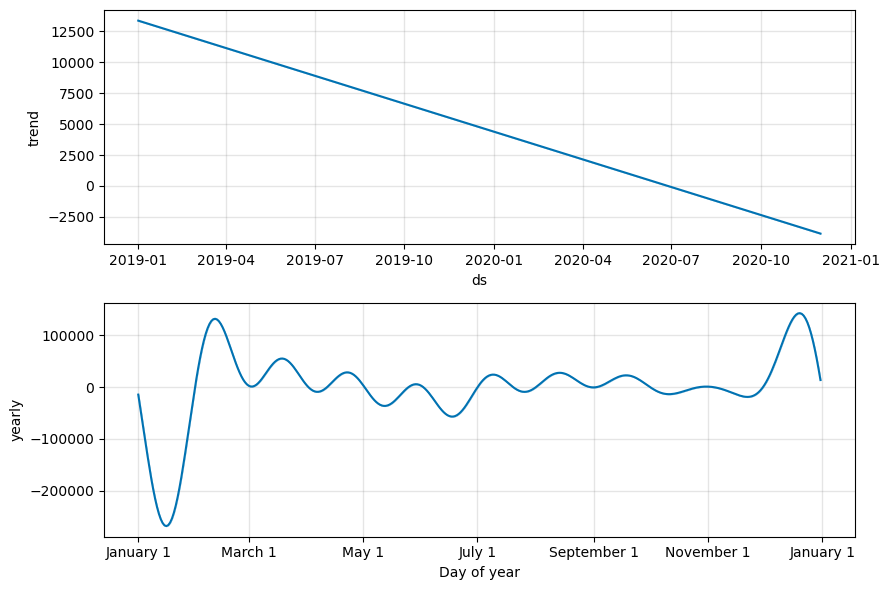

In [28]:
df_prophet = df_ve_cl.copy().rename(columns={
    'migration_month': 'ds',
    'num_migrants': 'y'
})

# Step 2: Convert date to datetime
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Step 3: Initialize Prophet
model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False
)

# Step 4: Fit the model to your data
model.fit(df_prophet)

# Step 5: Use the same data as the "future" frame (no need to extend it)
forecast = model.predict(df_prophet)

# Step 6: Plot the components (trend and seasonality)
model.plot_components(forecast)
plt.show()

20:58:33 - cmdstanpy - INFO - Chain [1] start processing
20:58:34 - cmdstanpy - INFO - Chain [1] done processing
/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



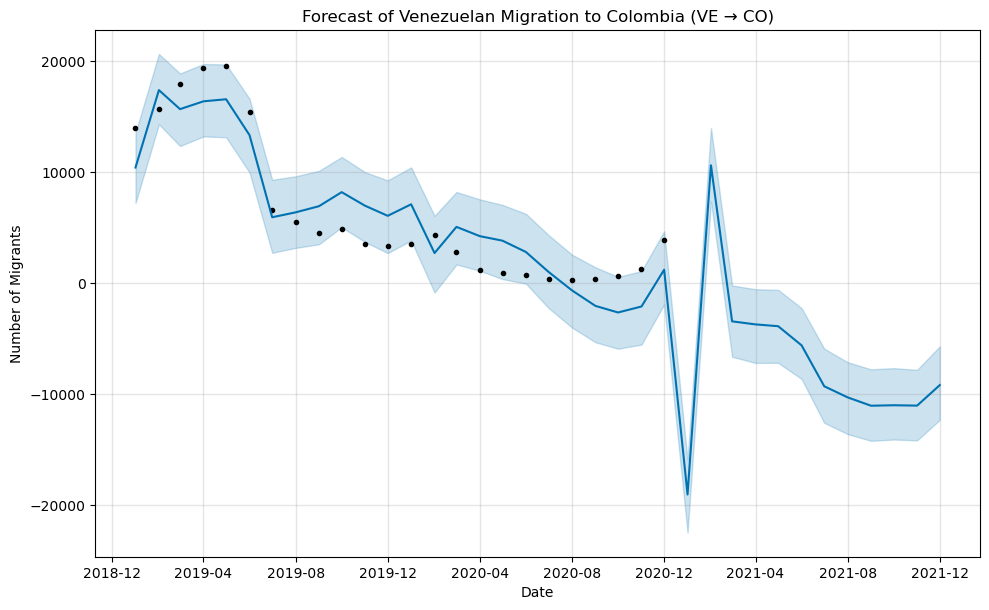

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/miniconda3/envs/geo_env_LLM/lib/python3.10/site-packages/prophet/plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



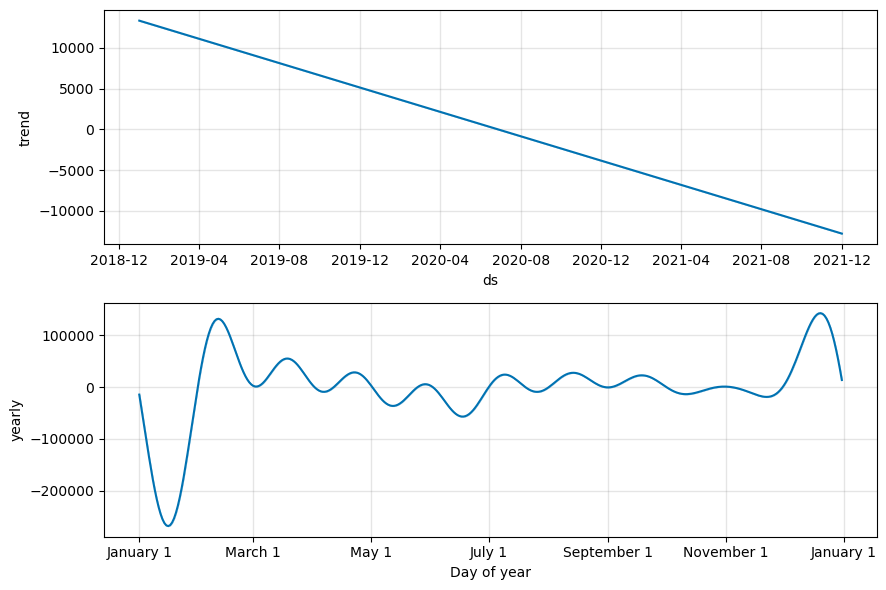

,ds,yhat,yhat_lower,yhat_upper
24,2021-01-01,-19045.548795,-22492.738773,-15930.947790
25,2021-02-01,10595.233273,7350.725041,13959.984438
26,2021-03-01,-3454.771129,-6643.483950,-223.554629
27,2021-04-01,-3729.280098,-7198.053980,-561.873882
28,2021-05-01,-3891.584512,-7187.151927,-614.710345
29,2021-06-01,-5614.886391,-8641.925884,-2258.604766
30,2021-07-01,-9299.489009,-12590.345301,-5907.083264
31,2021-08-01,-10300.297048,-13608.798233,-7133.543394
32,2021-09-01,-11052.376054,-14214.001700,-7773.836031
33,2021-10-01,-11008.666068,-14097.079406,-7666.553298


In [31]:
# Step 1. Prepare the data
df_prophet = df_ve_cl.copy().rename(columns={
    'migration_month': 'ds',
    'num_migrants': 'y'
})

df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Step 2. Initialize Prophet model
model = Prophet(
    yearly_seasonality=True,   # Important for migration patterns
    weekly_seasonality=False,
    daily_seasonality=False
)

# Step 3. Fit the model
model.fit(df_prophet)

# Step 4. Create a future dataframe for forecasting
# Determine how many months to predict
last_date = df_prophet['ds'].max()
future = model.make_future_dataframe(periods=12, freq='MS')  # Predict 12 months after last_date

# Step 5. Generate the forecast
forecast = model.predict(future)

# Step 6. Filter only the 2023 predictions
forecast_2023 = forecast[(forecast['ds'] >= '2021-01-01') & (forecast['ds'] <= '2021-12-31')]

# Step 7. Plot the forecast
fig1 = model.plot(forecast)
plt.title("Forecast of Venezuelan Migration to Colombia (VE → CO)")
plt.xlabel("Date")
plt.ylabel("Number of Migrants")
plt.show()

# Step 8. Plot trend & seasonality components
fig2 = model.plot_components(forecast)
plt.show()

# Step 9. Display predicted 2023 migration numbers
forecast_2023[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

# Baysian Test

In [ ]:
# Step 1: Create unique flow ID (origin -> destination)
df["flow_id"] = df["country_from"] + "_" + df["country_to"]

# Create numeric indices for flows and months
df["flow_index"] = df["flow_id"].astype("category").cat.codes
df["time_index"] = (
    (df["migration_month"].dt.year - df["migration_month"].dt.year.min()) * 12 +
    (df["migration_month"].dt.month - df["migration_month"].dt.month.min())
)

# Check unique flow mappings and time indexing
flow_map = df[["flow_id", "flow_index"]].drop_duplicates().reset_index(drop=True)
time_range = df["migration_month"].min(), df["migration_month"].max()
df

In [ ]:
# Your data:
flow_idx = df["flow_index"].values
time_idx = df["time_index"].values
y = df["num_migrants"].values
num_flows = df["flow_index"].nunique()
num_times = df["time_index"].nunique()

with pm.Model() as model:
    mu = pm.Normal("mu", mu=0, sigma=5)
    sigma_flow = pm.HalfNormal("sigma_flow", sigma=2)
    alpha = pm.Normal("alpha", mu=0, sigma=sigma_flow, shape=num_flows)
    sigma_time = pm.HalfNormal("sigma_time", sigma=2)
    beta = pm.Normal("beta", mu=0, sigma=sigma_time, shape=num_times)
    
    log_lambda = mu + alpha[flow_idx] + beta[time_idx]
    lambda_ = pm.math.exp(log_lambda)
    
    y_obs = pm.Poisson("y_obs", mu=lambda_, observed=y)

    trace = pm.sample(2000, tune=2000, target_accept=0.99, 
                      init='jitter+adapt_diag', chains=4, cores=4, max_treedepth=15, return_inferencedata=True)
    
    # trace = pm.sample(500, tune=500, chains=2, cores=2, target_accept=0.9)  # for simple test


| Term            | Meaning                                                                    |
| --------------- | -------------------------------------------------------------------------- |
| **mean**        | Posterior mean (best guess based on all chains)                            |
| **sd**          | Posterior standard deviation (uncertainty)                                 |
| **hdi\_3%-97%** | 94% credible interval (Bayesian version of confidence interval)            |
| **r\_hat**      | Should be \~1.00. Values >1.1 → **non-converged** (⚠️ yours are too high)  |
| **ess\_bulk**   | Effective sample size. You want this to be **much higher** (like >200)     |
| **trace plots** | Chain mixing over time — your `mu` and `sigma_*` are **not well-mixed** 😕 |


In [ ]:
az.plot_trace(trace, var_names=["mu", "sigma_flow", "sigma_time"])
az.summary(trace, var_names=["mu", "sigma_flow", "sigma_time"])

In [ ]:
# import numpy as np
# import arviz as az

# Extract posterior samples from trace
mu_samples = trace.posterior["mu"].values.flatten()
alpha_samples = trace.posterior["alpha"].values[:, :, 28].flatten()  # flow_index = 36 UK; 28 PL
beta_samples = trace.posterior["beta"].values[:, :, 38].flatten()    # time_index = 41

# Compute log-lambda samples
log_lambda_samples = mu_samples + alpha_samples + beta_samples

# Convert to rate (expected migrant count)
lambda_samples = np.exp(log_lambda_samples)

# Summary statistics
mean_prediction = lambda_samples.mean()
median_prediction = np.median(lambda_samples)
hdi_interval = az.hdi(lambda_samples, hdi_prob=0.94)

print(f"Estimated migrants from UA to UK in 2022-04:")
print(f"  Posterior mean: {mean_prediction:.2f}")
print(f"  Posterior median: {median_prediction:.2f}")
print(f"  94% credible interval: {hdi_interval[0]:.2f} to {hdi_interval[1]:.2f}")


In [ ]:
# df[(df['country_from'] == 'UA') & (df['country_to'] == 'PL')]
# df[(df['country_from'] == 'UA') & (df['country_to'] == 'UK')]
df[(df['flow_index'] == 28) & (df['time_index'] == 38)]